<h1 style="background-color: #9E9A75; padding: 20px; color:white; fontsize:40px;">Part 3: Model Training with scikit-learn models</h1>

# Table of Contents (WIP)
1. [Import Libraries](#Libraries)
2. [Feature Engineering](#feature)
3. [Model Training](#train)
4. [Model Evaluation](#eval)
5. [Model Improvement with Hyperparameter Tuning](#tune)

In [1]:
# Mount google drive
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


<a id='Libraries'></a>
# Import Libraries

In [2]:
import os
from os import listdir
from os.path import isfile, join
import shutil
import PIL
from PIL import Image
from skimage import transform
from joblib import dump, load

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

military_palette = ['#6B8E23', '#4B5320', '#78866B', '#C3B091']
sns.set_palette(military_palette)

# Preprocessing
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler

# Training
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Evaluation
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, roc_auc_score, auc

import warnings
warnings.filterwarnings('ignore')

## Load Modified Dataset from Kaggle

In [3]:
!pip install kaggle

In [4]:
# CONSTANTS
DATA_DIR = '/content/dataset'
IMG_DIM = 100
CHANNELS = 3

# CONSTANTS
landuse_dict = {
    'highdensitybuildings':0,
    'lowdensitybuildings':1,
    'roads':2,
    'recreational':3,
    'harbor':4,
    'beach':5,
    'forest':6,
    'river':7,
    'runway':8,
    'storagetanks':9,
}
CLASSES = list(landuse_dict.keys())
NUM_CLASSES = len(CLASSES)

In [5]:
if not os.path.exists(DATA_DIR):
  # Create directory to store kaggle credentials
  !mkdir ~/.kaggle
  # Add kaggle.json file in your root folder
  !cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
  # Set Permissions
  !chmod 600 ~/.kaggle/kaggle.json
  # Download dataset
  !kaggle datasets download -d racheltanminzhi/landuse
  # Unzip folder
  !unzip /content/landuse.zip -d /content/dataset/
else:
  print('Directory already exists.')

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/recreational/recreational_00502.png  
  inflating: /content/dataset/recreational/recreational_00503.png  
  inflating: /content/dataset/recreational/recreational_00504.png  
  inflating: /content/dataset/recreational/recreational_00505.png  
  inflating: /content/dataset/recreational/recreational_00506.png  
  inflating: /content/dataset/recreational/recreational_00507.png  
  inflating: /content/dataset/recreational/recreational_00508.png  
  inflating: /content/dataset/recreational/recreational_00509.png  
  inflating: /content/dataset/recreational/recreational_00510.png  
  inflating: /content/dataset/recreational/recreational_00511.png  
  inflating: /content/dataset/recreational/recreational_00512.png  
  inflating: /content/dataset/recreational/recreational_00513.png  
  inflating: /content/dataset/recreational/recreational_00514.png  
  inflating: /content/dataset/recreational/recreational_00515.png

In [6]:
def create_ds(dir):
    filenames = []
    y = []
    for root, directories, files in os.walk(dir):
        for file in files:
            y.append(landuse_dict[root.split('/')[-1]])
            filenames.append(os.path.join(root, file))
    X = np.stack([(Image.open(file)).resize((IMG_DIM, IMG_DIM)) for file in filenames])
    y = np.array(y)
    return X, y

In [7]:
X, y = create_ds('/content/dataset')

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [9]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(7600, 100, 100, 3)
(7600,)
(1901, 100, 100, 3)
(1901,)


<a id='feature'></a>
# Feature Engineering

**Build Pipeline**

In [10]:
X_train = X_train.reshape(X_train.shape[0], IMG_DIM*IMG_DIM*CHANNELS)
X_test = X_test.reshape(X_test.shape[0], IMG_DIM*IMG_DIM*CHANNELS)

In [11]:
preprocessor = Pipeline(steps=[
    ('normalize', MinMaxScaler()),
])
# Fit and transform data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.fit_transform(X_test)

<a id='train'></a>
# Model Training

In [12]:
def fit_model(model):
    # Fit model on train set
    model.fit(X_train, y_train)

    # Make Prediction
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    # Calculate probability
    predprob = model.predict_proba(X_test)

    # ===== Evaluation =====
    # Get accuracy of predictions
    train_score = accuracy_score(y_train, y_pred_train)
    test_score = accuracy_score(y_test, y_pred_test)

    # Get precision, recall, f1 score
    precision = precision_score(y_test, y_pred_test, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred_test, average='weighted')
    f1 = f1_score(y_test, y_pred_test, average='weighted')

    # Store metrics
    metrics = [train_score*100, test_score*100, precision, recall, f1]
    return metrics, y_pred_test, predprob

In [13]:
# Initialise models
nb = GaussianNB()
knn=KNeighborsClassifier(n_neighbors=30)
dt = DecisionTreeClassifier(max_depth=15, min_samples_split=5, min_samples_leaf=5,
                            class_weight='balanced', random_state=1)
rf = RandomForestClassifier(n_estimators=150, max_depth=15, min_samples_split=5, min_samples_leaf=10,
                            class_weight='balanced', random_state=1)

# Get models
models = [nb, knn, dt, rf]
# Get model names
model_names = [type(model).__name__ for model in models]
model_names

['GaussianNB',
 'KNeighborsClassifier',
 'DecisionTreeClassifier',
 'RandomForestClassifier']

In [14]:
# Create a dictionary to map the model to its index
model_dict = {}
for i, model in enumerate(model_names):
  model_dict[model] = i
model_dict

{'GaussianNB': 0,
 'KNeighborsClassifier': 1,
 'DecisionTreeClassifier': 2,
 'RandomForestClassifier': 3}

<a id='eval'></a>
# Model Evaluation

## Accuracy, Precision, Recall, F1 Score

In [15]:
# Train and get metrics from all models
results = [fit_model(model) for model in models]
metrics_scores = [score[0] for score in results]
predictions = [y_pred[1] for y_pred in results]
predprobas = [y_prob[2] for y_prob in results]
df_eval = pd.DataFrame(metrics_scores, index=model_names,
                      columns = ['Train Accuracy', 'Test Accuracy', 'Precision', 'Recall', 'F1 Score'])
df_eval

,Train Accuracy,Test Accuracy,Precision,Recall,F1 Score
GaussianNB,21.500000,20.199895,0.241636,0.201999,0.162201
KNeighborsClassifier,27.263158,23.829563,0.168819,0.238296,0.177376
DecisionTreeClassifier,67.644737,22.619674,0.235869,0.226197,0.228104
RandomForestClassifier,93.118421,39.189900,0.387087,0.391899,0.377690


## Classification Reports
Evaluate individual precision, recall, more details to support the previous table

In [16]:
# Print classification report for all classifiers
for model, y_pred in zip(model_names, predictions):
    print(f'------{model}------\n{classification_report(y_test, y_pred)}\n')

------GaussianNB------
              precision    recall  f1-score   support

           0       0.25      0.05      0.09       300
           1       0.19      0.02      0.04       200
           2       0.37      0.06      0.10       400
           3       0.23      0.29      0.26       300
           4       0.32      0.60      0.42       100
           5       0.24      0.66      0.35       100
           6       0.18      0.57      0.28       100
           7       0.11      0.30      0.16       100
           8       0.17      0.08      0.11       201
           9       0.11      0.24      0.15       100

    accuracy                           0.20      1901
   macro avg       0.22      0.29      0.19      1901
weighted avg       0.24      0.20      0.16      1901


------KNeighborsClassifier------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       300
           1       0.10      0.01      0.02       200
           2       0.

## Confusion Matrix

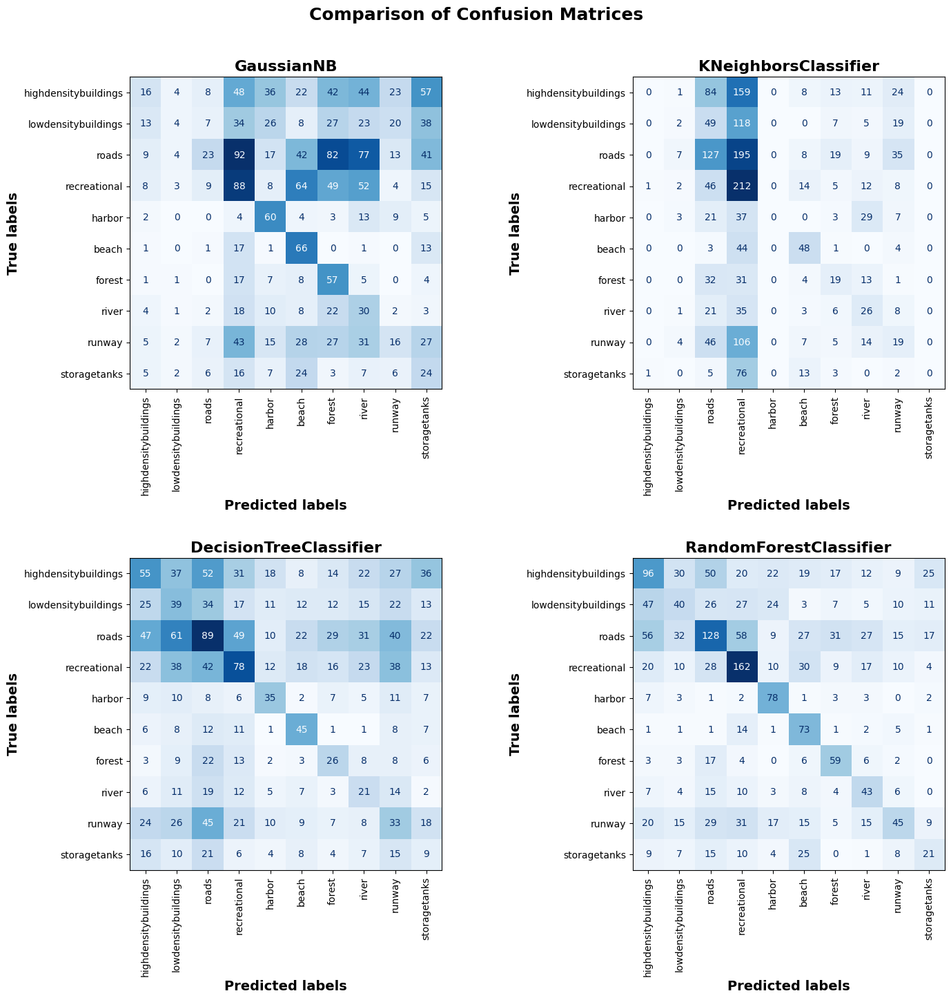

In [17]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))
fig.suptitle('Comparison of Confusion Matrices', size=18, fontweight='bold')
for cls, y_pred, ax in zip(models, predictions, axes.flatten()):
    # Plot confusion matrix
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, ax=ax, cmap='Blues', colorbar=False, display_labels=CLASSES)
    # Set title as the classifier's name
    ax.set_title(type(cls).__name__, size=16, fontweight='bold')
    # Change label and tick labels size
    ax.set_xlabel('Predicted labels', size=14, fontweight='bold')
    ax.set_ylabel('True labels', size=14, fontweight='bold')
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.set_xticklabels(CLASSES, rotation=90)
fig.tight_layout(pad = 3.0)
plt.show()

## AUC-ROC Curve

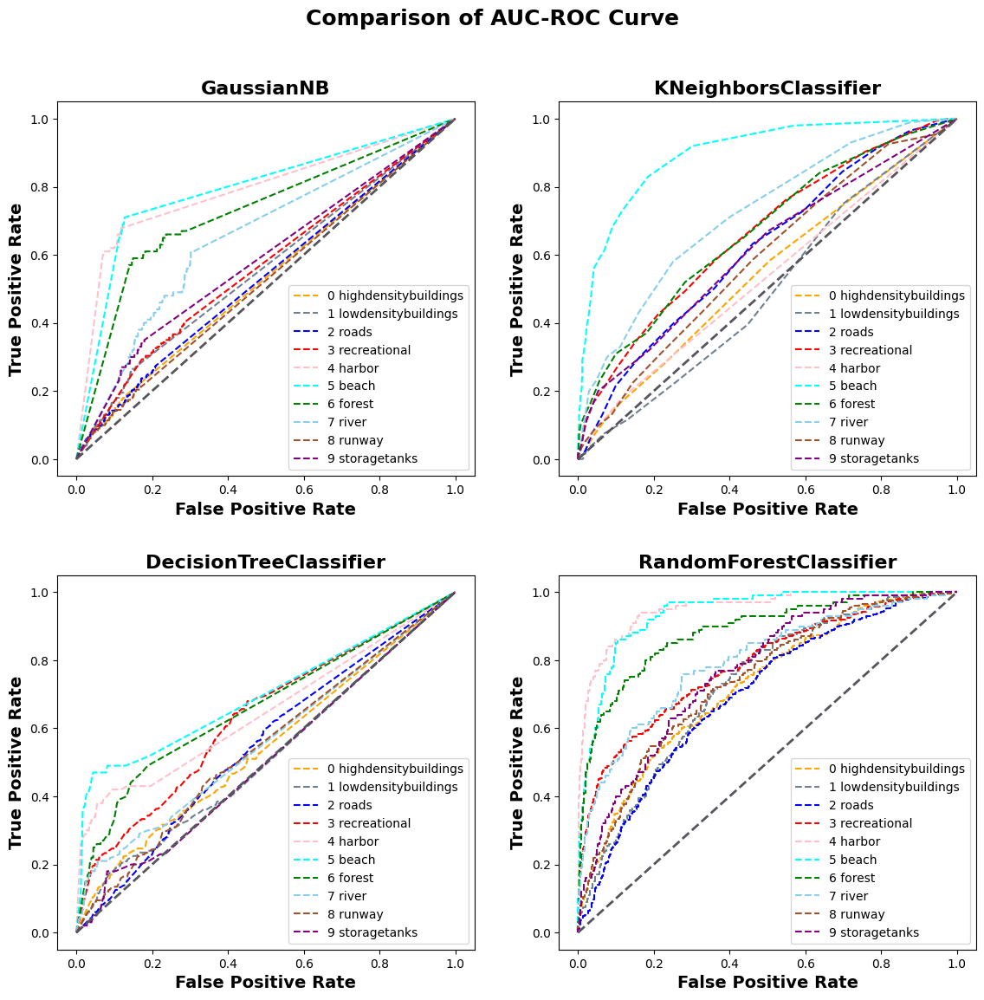

In [18]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
fig.suptitle('Comparison of AUC-ROC Curve', size=18, fontweight='bold')
auc_list = []
for cls, y_pred, y_prob, ax in zip(models, predictions, predprobas, axes.flatten()):
    auc_score = {}
    fpr = {}
    tpr = {}
    thresh ={}

    # compute roc by passing in the actual and predicted values
    for i in range(NUM_CLASSES):
        fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_prob[:,i], pos_label=i)
        auc_score[i] = auc(fpr[i], tpr[i])

    auc_list.append(auc_score)

    # plotting
    ax.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='0 highdensitybuildings')
    ax.plot(fpr[1], tpr[1], linestyle='--',color='slategrey', label='1 lowdensitybuildings')
    ax.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='2 roads')
    ax.plot(fpr[3], tpr[3], linestyle='--',color='red', label='3 recreational')
    ax.plot(fpr[4], tpr[4], linestyle='--',color='pink', label='4 harbor')
    ax.plot(fpr[5], tpr[5], linestyle='--',color='cyan', label='5 beach')
    ax.plot(fpr[6], tpr[6], linestyle='--',color='green', label='6 forest')
    ax.plot(fpr[7], tpr[7], linestyle='--',color='skyblue', label='7 river')
    ax.plot(fpr[8], tpr[8], linestyle='--',color='sienna', label='8 runway')
    ax.plot(fpr[9], tpr[9], linestyle='--',color='purple', label='9 storagetanks')

    ax.plot([0, 1], [0, 1], color='#56545C', lw=2, linestyle='--')
    # Set title as the classifier's name
    ax.set_title(type(cls).__name__, size = 16, fontweight='bold')
    # Set axes labels
    ax.set_xlabel('False Positive Rate', size = 14, fontweight='bold')
    ax.set_ylabel('True Positive Rate', size = 14, fontweight='bold')
    # Set legend
    ax.legend(loc="lower right")

fig.tight_layout(pad = 3.0)
plt.show()

In [19]:
df_auc = pd.DataFrame(auc_list, index=model_names)
df_auc = df_auc.set_axis(CLASSES, axis=1)
df_auc

,highdensitybuildings,lowdensitybuildings,roads,recreational,harbor,beach,forest,river,runway,storagetanks
GaussianNB,0.529119,0.556872,0.534460,0.564482,0.791105,0.792499,0.726602,0.652909,0.522208,0.586527
KNeighborsClassifier,0.546868,0.496195,0.619231,0.662541,0.533268,0.898753,0.668912,0.721574,0.589183,0.612771
DecisionTreeClassifier,0.542511,0.515079,0.549914,0.632250,0.648953,0.699170,0.663709,0.560919,0.545009,0.505980
RandomForestClassifier,0.724164,0.726537,0.696795,0.785532,0.951738,0.938701,0.884670,0.796963,0.739681,0.766868


In [20]:
df_auc.reset_index(inplace=True)
df_auc.rename(columns={'index': 'models'}, inplace=True)
df_auc = df_auc.melt('models', var_name='label', value_name='auc')
df_auc

,models,label,auc
0,GaussianNB,highdensitybuildings,0.529119
1,KNeighborsClassifier,highdensitybuildings,0.546868
2,DecisionTreeClassifier,highdensitybuildings,0.542511
3,RandomForestClassifier,highdensitybuildings,0.724164
4,GaussianNB,lowdensitybuildings,0.556872
5,KNeighborsClassifier,lowdensitybuildings,0.496195
6,DecisionTreeClassifier,lowdensitybuildings,0.515079
7,RandomForestClassifier,lowdensitybuildings,0.726537
8,GaussianNB,roads,0.534460
9,KNeighborsClassifier,roads,0.619231


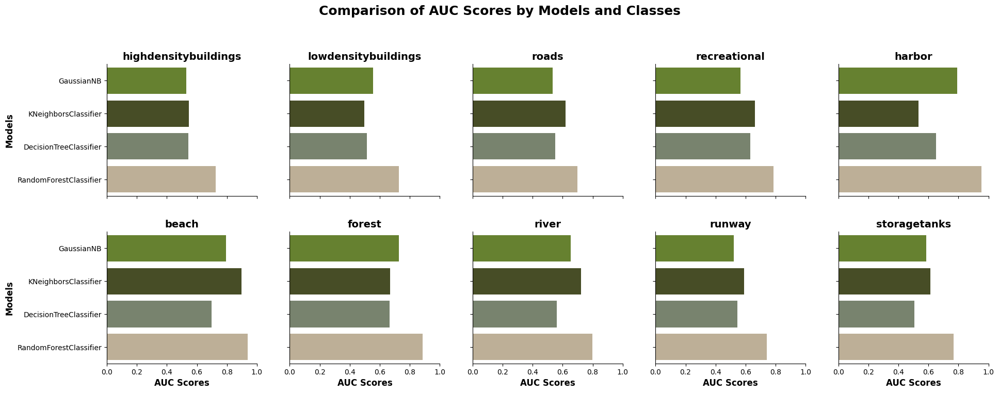

In [21]:
g = sns.catplot(data=df_auc, x='auc', y='models', col='label', col_wrap=5, kind='bar', palette=military_palette, height=4)
g.fig.subplots_adjust(top=0.9, hspace = 0.8)
g.fig.suptitle('Comparison of AUC Scores by Models and Classes', size=18, fontweight='bold')
g.set_axis_labels('AUC Scores', 'Models', size=12, fontweight='bold')
g.set_titles('{col_name}', size=14, fontweight='bold')
g.set(xlim=(0, 1))
g.fig.tight_layout(pad = 3.0)
plt.show()

## Confidence Levels

In [22]:
def conf_levels(idx):
  # Calculate probability
  predprob = predprobas[idx]
  predclass = predictions[idx]

  # Set a condition to filter for records that were incorrectly predicted
  condition = (predclass != y_test)

  # Get the highest percentage out of all classes
  confidence = np.max(predprob, axis=1)

  # Filter for records that were incorrectly predicted
  incorrect_confidence = confidence[condition]

  # Store values in a list
  mean_confidence = []
  for num in range(0, 10):
    # Calculate average confidence of model in its predictions
    mean_val = np.mean(confidence[y_test == num])
    mean_confidence.append(f'{mean_val*100:.2f}%')

  # Create a dataframe to display values
  class_names = pd.Series(CLASSES)
  mean_confidence = pd.Series(mean_confidence)
  df_confidence = pd.concat([class_names, mean_confidence], axis=1)
  df_confidence.columns = ['Class', 'Confidence Level']
  df_confidence.sort_values('Confidence Level', key=lambda x: x.str.rstrip('%').astype(float), ascending=False, inplace=True)

  ## For plotting incorrectly predicted image samples
  # Actual class of records for incorrectly classified samples
  true_class = y_test[condition]
  # Incorrectly predicted class
  incorrect_pred = predclass[condition]

  # Filter for incorrect val images
  X_test_incorrect = X_test[condition]
  X_test_incorrect = X_test_incorrect.reshape(incorrect_pred.shape[0], 100, 100, 3)

  # Define number of samples
  num_samples = 30
  # Choose samples randomly
  random_idxpred = np.random.choice(incorrect_pred.shape[0], num_samples, replace=False)

  # Plot samples
  fig, axes = plt.subplots(5, 5, figsize=(15, 15))
  fig.suptitle('Predicted vs Actual Class Labels for Incorrectly Predicted Samples', size = 18, y = 1.02, fontweight='bold')

  for idx, ax in zip(random_idxpred, axes.flatten()):
    ax.imshow(X_test_incorrect[idx], cmap='gray')
    ax.set_title(f'Actual: {CLASSES[true_class[idx]]}\nPredicted: {CLASSES[incorrect_pred[idx]]}\
      \n({incorrect_confidence[idx]*100:.2f}%)', color='red')
    ax.axis('off')
  fig.tight_layout()
  plt.show()
  return df_confidence

### Naive Bayes

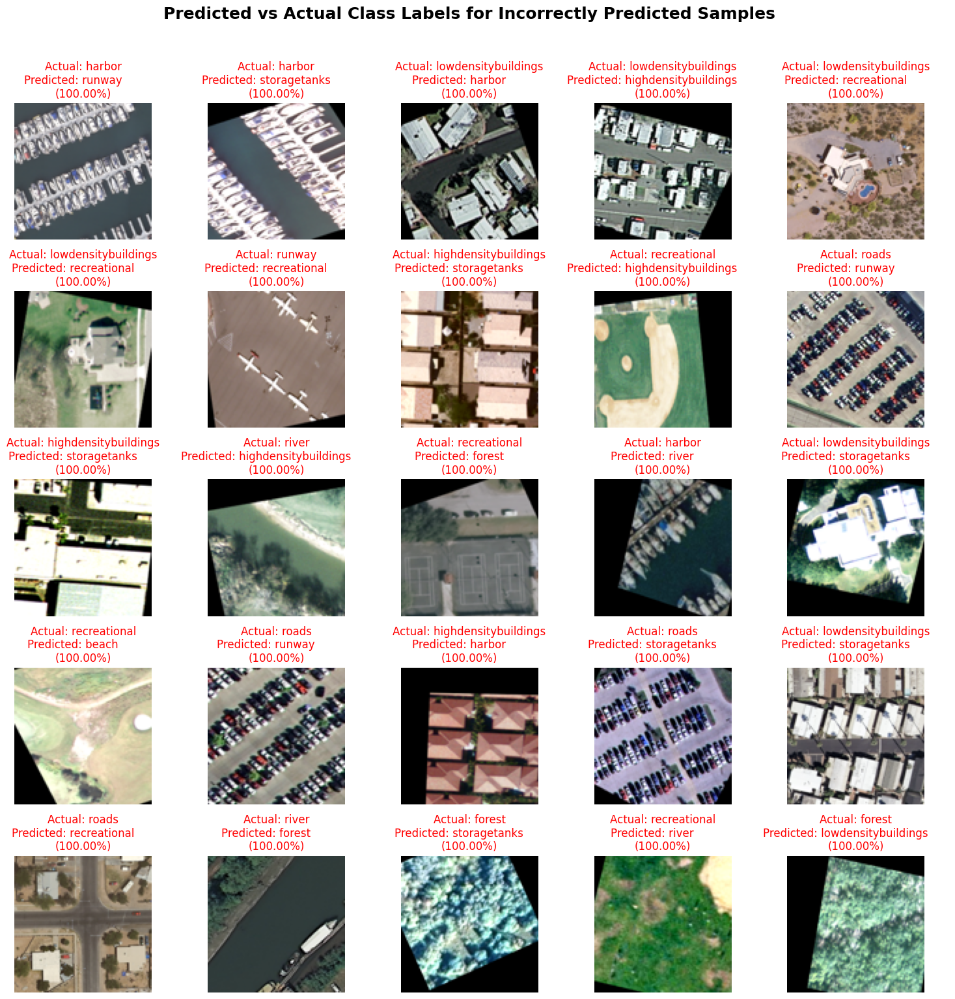

In [23]:
df_confidenceNB = conf_levels(model_dict['GaussianNB'])

In [24]:
df_confidenceNB

,Class,Confidence Level
3,recreational,100.00%
5,beach,100.00%
6,forest,100.00%
7,river,100.00%
8,runway,100.00%
9,storagetanks,100.00%
2,roads,99.94%
0,highdensitybuildings,99.87%
1,lowdensitybuildings,99.80%
4,harbor,99.74%


### K-Nearest Neighbours

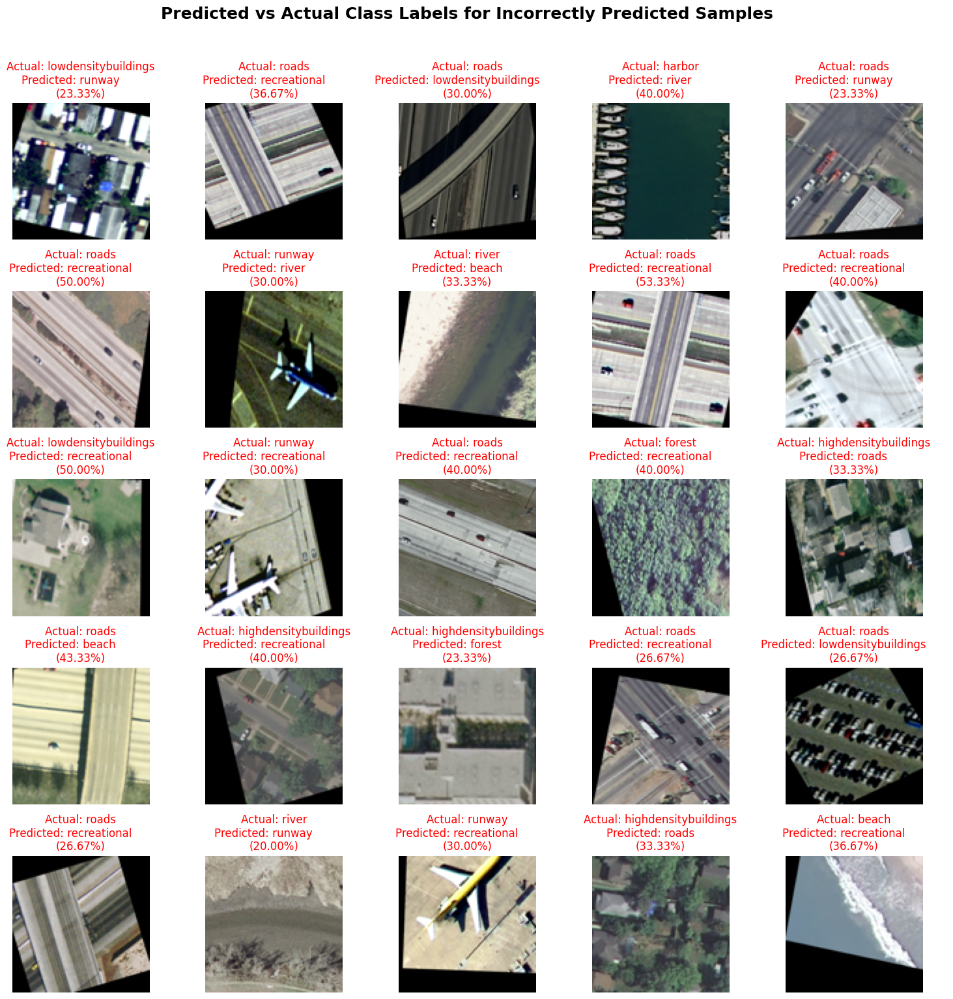

In [25]:
df_confidenceKNN = conf_levels(model_dict['KNeighborsClassifier'])

In [26]:
df_confidenceKNN

,Class,Confidence Level
5,beach,46.87%
9,storagetanks,40.80%
3,recreational,40.42%
8,runway,35.59%
1,lowdensitybuildings,35.37%
2,roads,35.28%
0,highdensitybuildings,34.74%
6,forest,33.83%
7,river,33.33%
4,harbor,32.70%


### Decision Tree

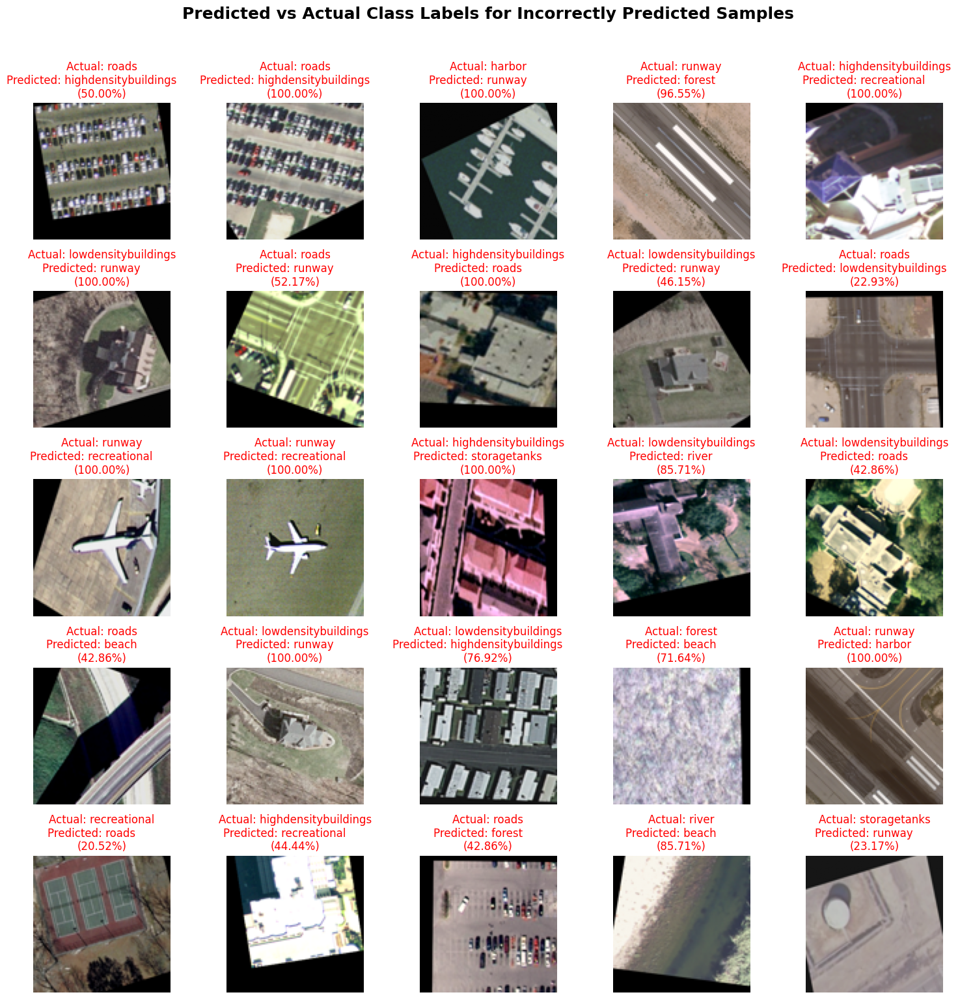

In [27]:
df_confidenceDT = conf_levels(model_dict[ 'DecisionTreeClassifier'])

In [28]:
df_confidenceDT

,Class,Confidence Level
5,beach,85.15%
4,harbor,78.04%
1,lowdensitybuildings,72.31%
0,highdensitybuildings,71.11%
7,river,71.10%
3,recreational,68.75%
6,forest,68.35%
9,storagetanks,67.26%
8,runway,63.92%
2,roads,62.62%


### Random Forest


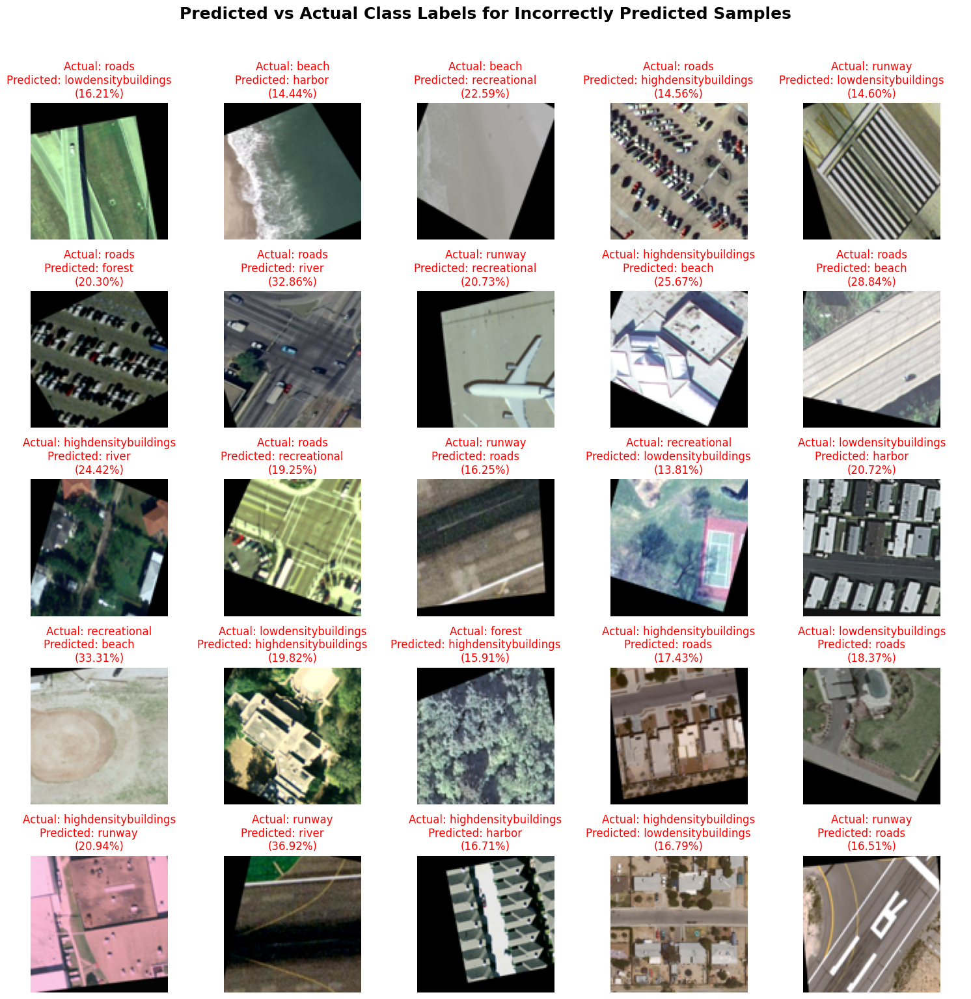

In [29]:
df_confidenceRF= conf_levels(model_dict['RandomForestClassifier'])

In [30]:
df_confidenceRF

,Class,Confidence Level
5,beach,40.35%
4,harbor,29.55%
3,recreational,24.45%
7,river,23.89%
6,forest,22.11%
8,runway,21.33%
9,storagetanks,21.14%
2,roads,19.08%
0,highdensitybuildings,18.51%
1,lowdensitybuildings,18.14%


<a id='tune'></a>
# Model Improvement with Hyperparameter Tuning
We will do hyperparameter tuning on the random forest model with the goal of reducing overfitting and increase the accuracy on the test set.

In [31]:
# Preprocess
X = X.reshape(X.shape[0], IMG_DIM*IMG_DIM*CHANNELS)
X = preprocessor.fit_transform(X)

In [32]:
# Initialise cross validation
cv = StratifiedKFold(n_splits=3, random_state=1, shuffle=True)
def cross_validate(model):
    # evaluate model
    cv_scores = cross_val_score(model, X, y, cv=cv)
    # return mean of scores
    return np.mean(cv_scores)*100

In [34]:
mean_score = cross_validate(models[model_dict['RandomForestClassifier']])
print(f"Current Results: {mean_score/100:.5f} with 'class_weight': 'balanced', 'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 10, 'n_estimators': 150")

Current Results: 0.37859 with 'class_weight': 'balanced', 'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 10, 'n_estimators': 150


In [36]:
rf_param_grid = dict(class_weight=['balanced'], max_depth=[15], min_samples_split=[5, 10], min_samples_leaf=[10, 20], n_estimators=[150, 175])
rf_grid_search = GridSearchCV(estimator=models[model_dict['RandomForestClassifier']], param_grid=rf_param_grid, cv=cv)
rf_grid_result = rf_grid_search.fit(X, y)
# Print best results
print(f'Best Results: {rf_grid_search.best_score_:.5f} with {rf_grid_result.best_params_}')

Best Results: 0.38228 with {'class_weight': 'balanced', 'max_depth': 15, 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 175}


Saved model file

In [37]:
rf_improved = RandomForestClassifier(n_estimators=175, max_depth=15, min_samples_split=5, min_samples_leaf=10,
                            class_weight='balanced', random_state=1)

In [38]:
dump(rf_improved, 'baseline_model.joblib')

['baseline_model.joblib']

---